# Audio classification using convolutional neural networks


## Generate spectrograms


In [1]:
import numpy as np
import librosa.display, os
import matplotlib.pyplot as plt
%matplotlib inline

def create_spectrogram(audio_file, image_file):
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1)

    y, sr = librosa.load(audio_file)
    ms = librosa.feature.melspectrogram(y=y, sr=sr)
    log_ms = librosa.power_to_db(ms, ref=np.max)
    librosa.display.specshow(log_ms, sr=sr)

    fig.savefig(image_file)
    plt.close(fig)
    
def create_pngs_from_wavs(input_path, output_path):
    if not os.path.exists(output_path):
        os.makedirs(output_path)

    dir = os.listdir(input_path)

    for i, file in enumerate(dir):
        input_file = os.path.join(input_path, file)
        output_file = os.path.join(output_path, file.replace('.wav', '.png'))
        # print("output_file:::", output_file)
        create_spectrogram(input_file, output_file)

Create PNG files containing spectrograms from all the WAV files in the "Sounds/background" directory.

In [2]:
create_pngs_from_wavs('Sounds/background', 'Spectrograms/background')

Create PNG files containing spectrograms from all the WAV files in the "Sounds/chainsaw" directory.

In [3]:
create_pngs_from_wavs('Sounds/chainsaw', 'Spectrograms/chainsaw')

Create PNG files containing spectrograms from all the WAV files in the "Sounds/engine" directory.

In [4]:
create_pngs_from_wavs('Sounds/engine', 'Spectrograms/engine')

Create PNG files containing spectrograms from all the WAV files in the "Sounds/storm" directory.

In [5]:
create_pngs_from_wavs('Sounds/storm', 'Spectrograms/storm')

Define two new helper functions for loading and displaying spectrograms and declare two Python lists — one to store spectrogram images, and another to store class labels.

In [12]:
from keras.preprocessing import image

def load_images_from_path(path, label):
    images = []
    labels = []

    for file in os.listdir(path):
        images.append(image.img_to_array(image.load_img(os.path.join(path, file), target_size=(224, 224, 3))))
        labels.append((label))
        
    return images, labels

def show_images(images):
    fig, axes = plt.subplots(1, 8, figsize=(20, 20), subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i] / 255)
        
x = []
y = []

/Users/sharyl/Desktop/audio_detection/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


Load the background spectrogram images, add them to the list named `x`, and label them with 0s.

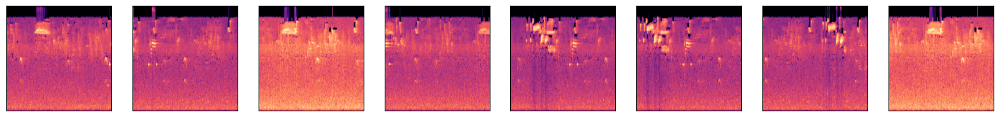

In [13]:
images, labels = load_images_from_path('Spectrograms/background', 0)
show_images(images)
    
x += images
y += labels

Load the chainsaw spectrogram images, add them to the list named `x`, and label them with 1s.

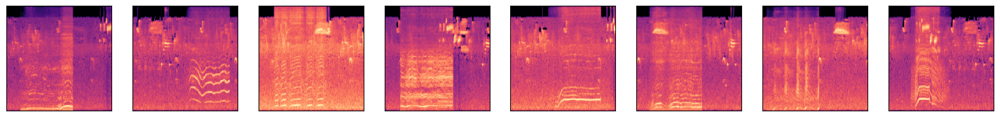

In [14]:
images, labels = load_images_from_path('Spectrograms/chainsaw', 1)
show_images(images)
    
x += images
y += labels

Load the engine spectrogram images, add them to the list named `x`, and label them with 2s.

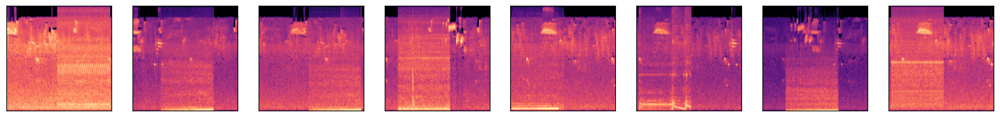

In [15]:
images, labels = load_images_from_path('Spectrograms/engine', 2)
show_images(images)
    
x += images
y += labels

Load the storm spectrogram images, add them to the list named `x`, and label them with 3s.

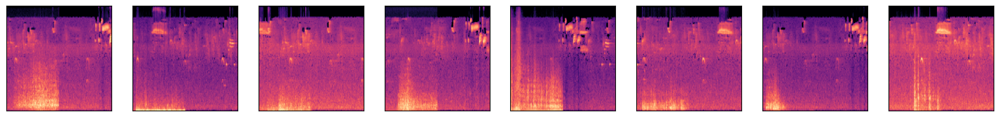

In [16]:
images, labels = load_images_from_path('Spectrograms/storm', 3)
show_images(images)
    
x += images
y += labels

Split the images and labels into two datasets — one for training, and one for testing. Then divide the pixel values by 255 and one-hot-encode the labels using Keras's [to_categorical](https://keras.io/api/utils/python_utils/#to_categorical-function) function.

In [17]:
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, stratify=y, test_size=0.3, random_state=0)

x_train_norm = np.array(x_train) / 255
x_test_norm = np.array(x_test) / 255

y_train_encoded = to_categorical(y_train)
y_test_encoded = to_categorical(y_test)

## Build and train a CNN

State-of-the-art image classification typically isn't done with traditional neural networks. Rather, it is performed with convolutional neural networks that use [convolution layers](https://machinelearningmastery.com/convolutional-layers-for-deep-learning-neural-networks/) to extract features from images and [pooling layers](https://machinelearningmastery.com/pooling-layers-for-convolutional-neural-networks/) to downsize images so features can be detected at various resolutions. The next task is to build a CNN containing a series of convolution and pooling layers for feature extraction, a pair of fully connected layers for classification, and a `softmax` layer that outputs probabilities for each class, and to train it with spectrogram images and labels. Start by defining the CNN.

In [18]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Flatten, Dense

model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(4, activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

/Users/sharyl/Desktop/audio_detection/.venv/lib/python3.9/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 128)  │        36,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │    18,875,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,212,548 (73.29 MB)

 Trainable params: 19,212,548 (73.29 MB)

 Non-trainable params: 0 (0.00 B)

Train the CNN and save the `history` object returned by `fit` in a local variable.

In [19]:
hist = model.fit(x_train_norm, y_train_encoded, validation_data=(x_test_norm, y_test_encoded), batch_size=10, epochs=10)

Epoch 1/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 14s 488ms/step - accuracy: 0.2668 - loss: 2.0251 - val_accuracy: 0.5000 - val_loss: 1.0418
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 10s 351ms/step - accuracy: 0.5260 - loss: 0.9581 - val_accuracy: 0.6917 - val_loss: 0.7127
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 9s 334ms/step - accuracy: 0.6733 - loss: 0.6728 - val_accuracy: 0.7083 - val_loss: 0.6758
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 9s 337ms/step - accuracy: 0.7371 - loss: 0.5462 - val_accuracy: 0.7333 - val_loss: 0.4885
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 9s 335ms/step - accuracy: 0.7906 - loss: 0.4544 - val_accuracy: 0.7917 - val_loss: 0.6000
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 11s 383ms/step - accuracy: 0.8579 - loss: 0.3527 - val_accuracy: 0.7417 - val_loss: 0.5719
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 10s 347ms/step - accuracy: 0.8352 - loss: 0.3101 - val_accuracy: 0.7083 - val_loss: 0.6069
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 9s 331ms/step - accuracy: 0.8786 - loss: 0.2954 - val_accuracy

Plot the training and validation accuracy.

[]

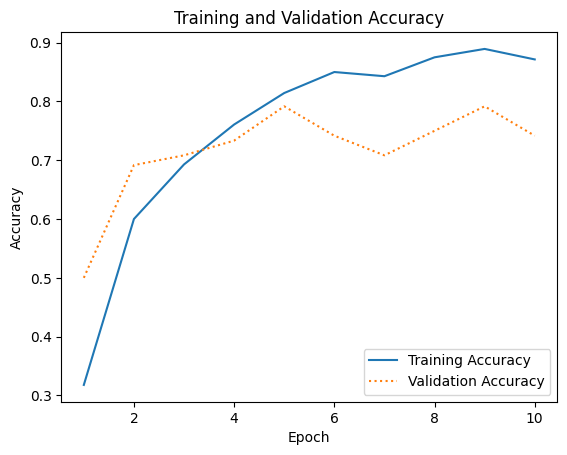

In [20]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, '-', label='Training Accuracy')
plt.plot(epochs, val_acc, ':', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.plot()

The accuracy is decent given that the network was trained with just 280 images, but it might be possible to achieve higher accuracy by employing transfer learning.

## Use transfer learning to improve accuracy


In [21]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet import preprocess_input

base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x_train_norm = preprocess_input(np.array(x_train))
x_test_norm = preprocess_input(np.array(x_test))

train_features = base_model.predict(x_train_norm)
test_features = base_model.predict(x_test_norm)

9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 254ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step


Define a neural network to classify features extracted by `MobileNetV2`.

In [22]:
model = Sequential()
model.add(Flatten(input_shape=train_features.shape[1:]))
model.add(Dense(1024, activation='relu'))
model.add(Dense(4, activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

/Users/sharyl/Desktop/audio_detection/.venv/lib/python3.9/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Train the network with features extracted by `MobileNetV2`.

In [23]:
hist = model.fit(train_features, y_train_encoded, validation_data=(test_features, y_test_encoded), batch_size=10, epochs=10)

Epoch 1/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 16s 558ms/step - accuracy: 0.4968 - loss: 50.7914 - val_accuracy: 0.7917 - val_loss: 9.1891
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 18s 639ms/step - accuracy: 0.8276 - loss: 8.3498 - val_accuracy: 0.8333 - val_loss: 4.1932
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 11s 385ms/step - accuracy: 0.9523 - loss: 0.7192 - val_accuracy: 0.9167 - val_loss: 1.3691
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 14s 480ms/step - accuracy: 0.9796 - loss: 0.3632 - val_accuracy: 0.9500 - val_loss: 0.8227
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 7s 239ms/step - accuracy: 0.9895 - loss: 0.0239 - val_accuracy: 0.9167 - val_loss: 1.3110
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 222ms/step - accuracy: 0.9903 - loss: 0.1122 - val_accuracy: 0.9167 - val_loss: 1.2823
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - accuracy: 0.9863 - loss: 0.0573 - val_accuracy: 0.8833 - val_loss: 3.2117
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 10s 376ms/step - accuracy: 0.9845 - loss: 0.1018 - val_accura

Plot the training and validation accuracy.

[]

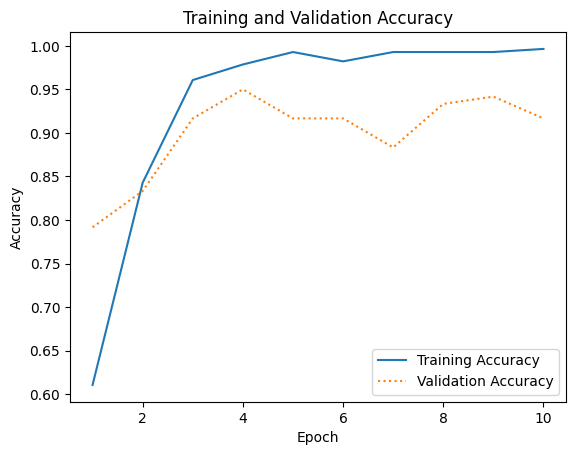

In [24]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, '-', label='Training Accuracy')
plt.plot(epochs, val_acc, ':', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.plot()

Run the test images through the network and use a confusion matrix to assess the results.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Text(110.44999999999997, 0.5, 'Actual label')

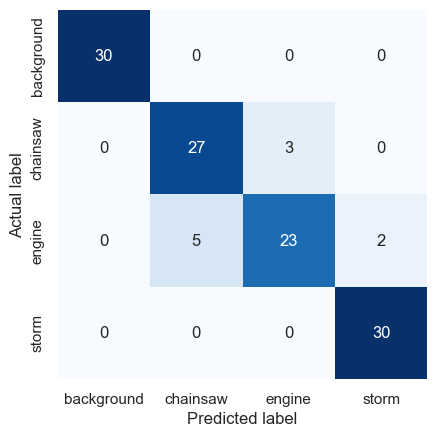

In [25]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
sns.set()

y_predicted = model.predict(test_features)
mat = confusion_matrix(y_test_encoded.argmax(axis=1), y_predicted.argmax(axis=1))
class_labels = ['background', 'chainsaw', 'engine', 'storm']

sns.heatmap(mat, square=True, annot=True, fmt='d', cbar=False, cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)

plt.xlabel('Predicted label')
plt.ylabel('Actual label')

The network is pretty adept at identifying clips that don't contain the sounds of chainsaw or engines. It sometimes confuses chainsaw sounds and engine sounds, but that's OK, because the presence of either might indicate illicit activity in a rain forest.

## Test with unrelated WAV files

The "Sounds" directory has a subdirectory named "samples" containing WAV files that the CNN was neither trained nor tested with. The WAV files bear no relation to the samples used for training and testing. Let's use the model trained to analyze these files for sounds of logging activity. We are Starting by creating a spectrogram from the first sample WAV file, which contains audio of loggers cutting down trees in the Amazon.

In [26]:
import IPython.display as ipd
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load('Sounds/samples/sample1.wav')
ipd.Audio('Sounds/samples/sample1.wav')

<Figure size 1400x500 with 0 Axes>

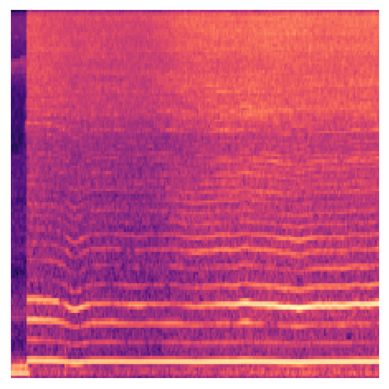

In [27]:
create_spectrogram('Sounds/samples/sample1.wav', 'Spectrograms/sample1.png')

x = image.load_img('Spectrograms/sample1.png', target_size=(224, 224))
plt.xticks([])
plt.yticks([])
plt.imshow(x)

Preprocess the spectrogram image, pass it to `MobileNetV2` for feature extraction, and classify the features.

In [28]:
x = image.img_to_array(x)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

y = base_model.predict(x)
predictions = model.predict(y)

for i, label in enumerate(class_labels):
    print(f'{label}: {predictions[0][i]}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
background: 0.0
chainsaw: 1.0
engine: 1.4935514906742344e-16
storm: 0.0


Create a spectrogram from a WAV file that includes the sounds of a logging truck rumbling through the rain forest.

In [29]:
fileName = 'Sounds/samples/sample2.wav'
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(fileName)
ipd.Audio(fileName)

<Figure size 1400x500 with 0 Axes>

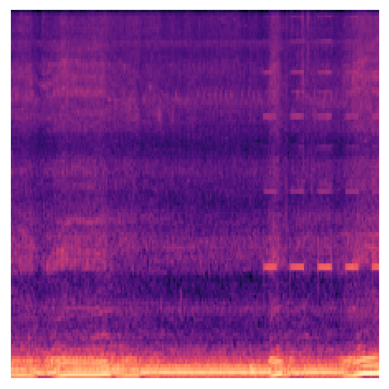

In [30]:
create_spectrogram('Sounds/samples/sample2.wav', 'Spectrograms/sample2.png')

x = image.load_img('Spectrograms/sample2.png', target_size=(224, 224))
plt.xticks([])
plt.yticks([])
plt.imshow(x)

Preprocess the spectrogram image, pass it to `MobileNetV2` for feature extraction, and classify the features.

In [31]:
x = image.img_to_array(x)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

y = base_model.predict(x)
predictions = model.predict(y)

for i, label in enumerate(class_labels):
    print(f'{label}: {predictions[0][i]}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
background: 0.0
chainsaw: 0.9959661960601807
engine: 0.0040337457321584225
storm: 0.0


If the network got either of the samples wrong, try training it again with the output from `MobileNetV2`. Remember that a neural network will train differently every time, in part because Keras initializes the weights and biases with small random values. In the real world, data scientists often train a neural network 20 or more times and average the results to quantify its accuracy.

In [ ]:
fileName = 'Sounds/samples/sample3.wav'
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(fileName)
ipd.Audio(fileName)

<Figure size 1400x500 with 0 Axes>

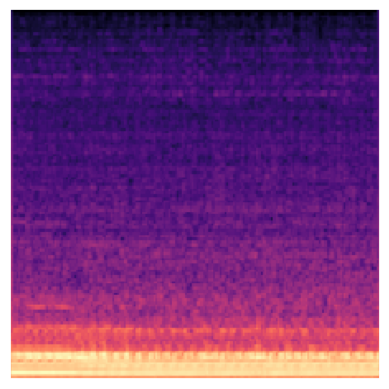

In [33]:
create_spectrogram(fileName, 'Spectrograms/sample3.png')

x = image.load_img('Spectrograms/sample3.png', target_size=(224, 224))
plt.xticks([])
plt.yticks([])
plt.imshow(x)

In [34]:
x = image.img_to_array(x)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

y = base_model.predict(x)
predictions = model.predict(y)

for i, label in enumerate(class_labels):
    print(f'{label}: {predictions[0][i]}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
background: 0.0
chainsaw: 7.926168706574994e-18
engine: 1.0
storm: 0.0


In [35]:
fileName = 'Sounds/samples/sample6.wav'
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(fileName)
ipd.Audio(fileName)

<Figure size 1400x500 with 0 Axes>

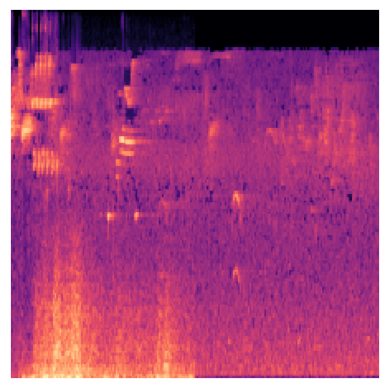

In [36]:
create_spectrogram(fileName, 'Spectrograms/sample6.png')

x = image.load_img('Spectrograms/sample6.png', target_size=(224, 224))
plt.xticks([])
plt.yticks([])
plt.imshow(x)

In [37]:
x = image.img_to_array(x)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

y = base_model.predict(x)
predictions = model.predict(y)

for i, label in enumerate(class_labels):
    print(f'{label}: {predictions[0][i]}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
background: 0.0
chainsaw: 0.0
engine: 0.0
storm: 1.0


In [38]:
import joblib
joblib.dump(model, './model/audioModel.pkl')

['./model/audioModel.pkl']

In [50]:
import joblib
joblib.dump(base_model, './model/base_model_audioModel.pkl')


['./model/base_model_audioModel.pkl']

In [58]:
bmodel = joblib.load('./model/base_model_audioModel.pkl')
mdl = joblib.load('./model/audioModel.pkl')

In [73]:

image_file_name = 'Sounds/samples/sample3.wav'.replace('.wav', '.png')
os.makedirs("./img", exist_ok=True )
# print(image_file_name.split("/"))
image_file = os.path.join('./img', image_file_name.split("/")[2])
print(type(image_file))
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)

y, sr = librosa.load('Sounds/samples/sample3.wav')
ms = librosa.feature.melspectrogram(y=y, sr=sr)
log_ms = librosa.power_to_db(ms, ref=np.max)
librosa.display.specshow(log_ms, sr=sr)

fig.savefig(image_file)
plt.close(fig)


x = image.load_img(image_file, target_size=(224, 224, 3))

<class 'str'>


In [ ]:
x = image.img_to_array(x)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)


y = bmodel.predict(x)
predictions = mdl.predict(y)
# highestKey = lam
print(predictions)

sound_dict = {}
for i, label in enumerate(class_labels):
    sound_dict[label] = predictions[0][i].item()
    print(f'{label}: {predictions[0][i]}')
    # st.write("Hello, *World!* :sunglasses:")


print("sound_dict", sound_dict)
max(sound_dict, key=sound_dict.get)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
[[0.000000e+00 7.926169e-18 1.000000e+00 0.000000e+00]]
background: 0.0
chainsaw: 7.926168706574994e-18
engine: 1.0
storm: 0.0
sound_dict {'background': 0.0, 'chainsaw': 7.926168706574994e-18, 'engine': 1.0, 'storm': 0.0}


'engine'